# Data Transformation

<br>

### Imports

In [1]:
import pandas as pd
import xarray as xr
import numpy as np
import numpy.ma as ma

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns

import os
import time
from itertools import product
from collections import OrderedDict
from datetime import datetime
from ipypb import track
import FEAutils as hlp

import satpy
from satpy import Scene
from pyresample.geometry import AreaDefinition
import geopandas as gpd
from shapely.geometry import Point
import cartopy.crs as ccrs
import pyinterp
import pyinterp.backends.xarray

import rasterio
from rasterio import Affine as A
from rasterio.warp import reproject, Resampling, calculate_default_transform, transform
from rasterio.control import GroundControlPoint
from rasterio.transform import xy

<br>

### User Input

In [2]:
data_dir = '../data/raw'

<br>

### Exploratory Data Analysis

We'll start by identifying the available files

In [3]:
native_fps = sorted([f'{data_dir}/{f}' for f in os.listdir(data_dir) if '.nat' in f])

native_fps[0]

'../data/raw/MSG3-SEVI-MSG15-0100-NA-20201001000414.060000000Z-NA.nat'

<br>

Then load one of them in as a SatPy scene

In [4]:
native_fp = native_fps[100]

scene = Scene(filenames=[native_fp], reader='seviri_l1b_native')

scene

<br>

We can get a list of the available datasets (bands)

In [5]:
scene.all_dataset_names()

['HRV',
 'IR_016',
 'IR_039',
 'IR_087',
 'IR_097',
 'IR_108',
 'IR_120',
 'IR_134',
 'VIS006',
 'VIS008',
 'WV_062',
 'WV_073']

<br>

Each band contains an XArray DataArray

In [6]:
scene.load(['HRV'])

scene['HRV']

C:\Users\Ayrto\anaconda3\envs\sat_image_processing\lib\site-packages\pyproj\crs\crs.py:543: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj_string = self.to_proj4()


<xarray.DataArray 'reshape-472681e5deddb58f184ea04aa25fb9f4' (y: 4176, x: 5568)>
dask.array<mul, shape=(4176, 5568), dtype=float32, chunksize=(1392, 5568), chunktype=numpy.ndarray>
Coordinates:
    crs      object PROJCRS["unknown",BASEGEOGCRS["unknown",DATUM["unknown",E...
  * y        (y) float64 1.395e+06 1.396e+06 1.397e+06 ... 5.57e+06 5.571e+06
  * x        (x) float64 2.877e+06 2.876e+06 2.875e+06 ... -2.689e+06 -2.69e+06
Attributes:
    orbital_parameters:                     {'projection_longitude': 9.5, 'pr...
    sun_earth_distance_correction_applied:  True
    sun_earth_distance_correction_factor:   1.001276457947253
    units:                                  %
    wavelength:                             0.7 µm (0.5-0.9 µm)
    standard_name:                          toa_bidirectional_reflectance
    platform_name:                          Meteosat-10
    sensor:                                 seviri
    start_time:                             2020-10-01 08:20:09.248659
    end_time:                               2020-10-01 08:25:10.256259
    area:                                   Area ID: geos_seviri_hrv\nDescrip...
    name:                                   HRV
    resolution:                             1000.134348869
    calibration:                            reflectance
    modifiers:                              ()
    _satpy_id:                              DataID(name='HRV', wavelength=Wav...
    ancillary_variables:                    []

<br>

We can see that the DataArray contains a crs, however we'll make our own custom area definition

In [7]:
def get_seviri_hrv_area_def(lower_east_column_planned:int=2733) -> AreaDefinition:
    """
    Args:
        east_column_planned: Taken from the Native file header:
          header['15_DATA_HEADER']['ImageDescription']['PlannedCoverageHRV']['LowerEastColumnPlanned']
          The HRV channel on Meteosat Second Generation satellites doesn't scan the full number of columns.
          The east boundary of the HRV channel changes (e.g. to maximise the amount of the image which
          is illuminated by sunlight.
    """
    
    x_offset = 32500 + ((2733 - lower_east_column_planned) * 1000)
    HRV_num_x_pixels = 5568
    HRV_num_y_pixels = 4176
    
    # The EUMETSAT docs say "The distance between spacecraft and centre of earth is 42,164 km. The idealized earth
    # is a perfect ellipsoid with an equator radius of 6378.1690 km and a polar radius of 6356.5838 km." 
    # The projection used by SatPy expresses height as height above the Earth's surface (not distance
    # to the centre of the Earth).
    
    projection = {
        'proj': 'geos',
        'lon_0': 9.5,
        'a': 6378169.0,
        'b': 6356583.8,
        'h': 35785831.00,
        'units': 'm'}

    seviri = AreaDefinition(
        area_id='seviri',
        description='SEVIRI RSS HRV',
        proj_id='seviri',   
        projection=projection,
        width=HRV_num_x_pixels,
        height=HRV_num_y_pixels,
        area_extent=[
            -2768872.0236 + x_offset, # left
             1394687.3495,            # bottom (from scene['HRV'].area)
             2799876.1893 + x_offset, # right
             5570248.4773]            # top (from scene['HRV'].area)
    )

    return seviri

handler = satpy.readers.seviri_l1b_native.NativeMSGFileHandler(native_fp, {}, None)
lower_east_column_planned = handler.header['15_DATA_HEADER']['ImageDescription']['PlannedCoverageHRV']['LowerEastColumnPlanned']

seviri = get_seviri_hrv_area_def(lower_east_column_planned)
seviri_crs = seviri.to_cartopy_crs()

seviri_crs

C:\Users\Ayrto\anaconda3\envs\sat_image_processing\lib\site-packages\pyproj\crs\crs.py:543: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj_string = self.to_proj4()


_PROJ4Projection(+ellps=WGS84 +a=6378169.0 +rf=295.488065897001 +h=35785831.0 +lon_0=9.5 +no_defs=True +proj=geos +type=crs +units=m +x_0=0.0 +y_0=0.0 +no_defs)

<br>

We'll create a loader function that will extract the relevant data for `lower_east_column_planned` automatically

In [8]:
%%time

def load_HRV_scene(native_fp):
    # Reading scene and loading HRV
    scene = Scene(filenames=[native_fp], reader='seviri_l1b_native')
    scene.load(['HRV'])

    # Identifying and recording lower_east_column_planned
    handler = satpy.readers.seviri_l1b_native.NativeMSGFileHandler(native_fp, {}, None)
    scene.attrs['lower_east_column_planned'] = handler.header['15_DATA_HEADER']['ImageDescription']['PlannedCoverageHRV']['LowerEastColumnPlanned']
    
    return scene

scene = load_HRV_scene(native_fp)

Wall time: 432 ms


C:\Users\Ayrto\anaconda3\envs\sat_image_processing\lib\site-packages\pyproj\crs\crs.py:543: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj_string = self.to_proj4()


<br>

We can visualise what a specific band looks like

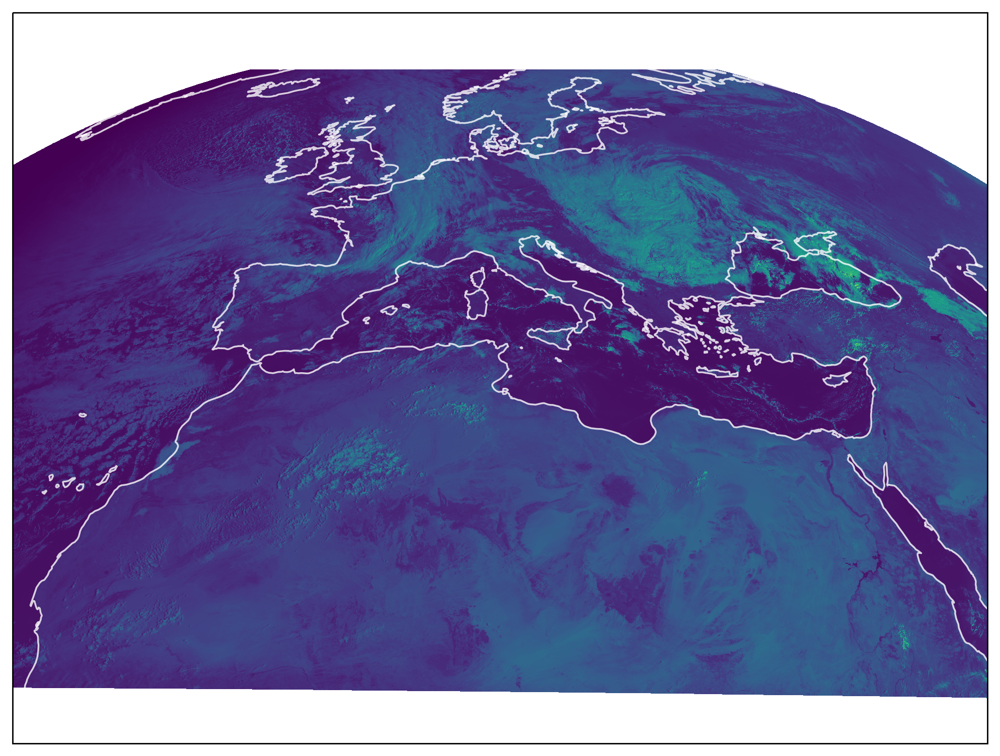

In [9]:
fig = plt.figure(dpi=250, figsize=(10, 10))
ax = plt.axes(projection=seviri_crs)

scene['HRV'].plot.imshow(ax=ax, add_colorbar=False)

ax.set_title('')
ax.coastlines(resolution='50m', alpha=0.8, color='white')

<br>

One of the benefits of having access to the underlying XArray object is that we can more easily start to do some analysis with the data, for example defining a reflectance threshold

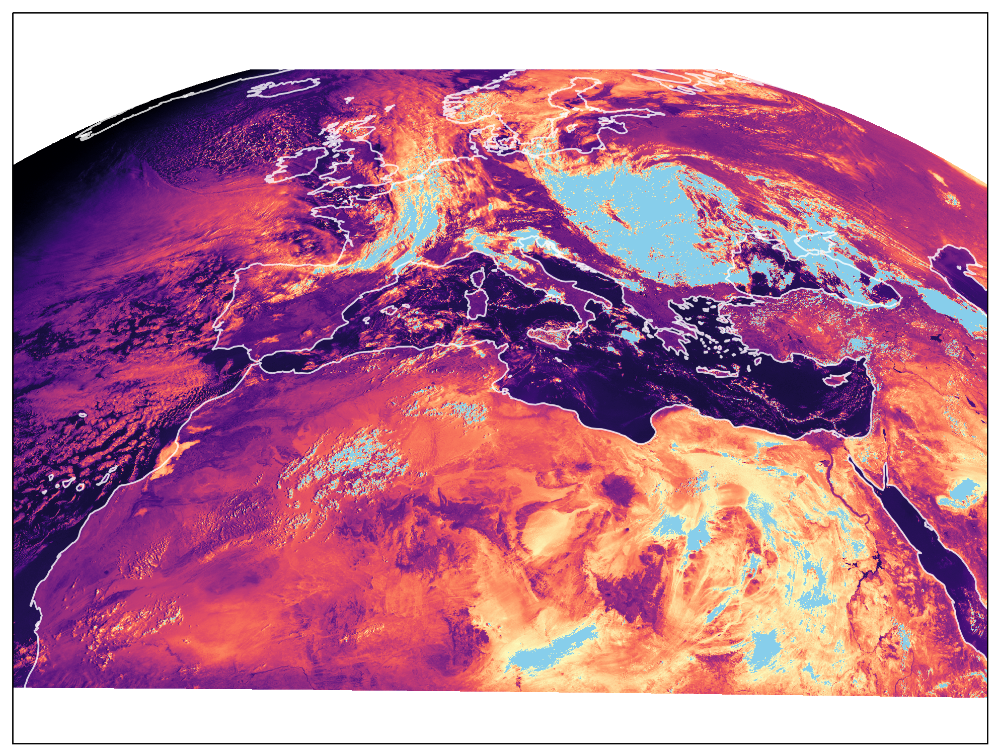

In [10]:
reflectance_threshold = 30

cmap = colors.ListedColormap([
    (0, 0, 0, 0), # transparent
    (0.533, 0.808, 0.922, 1) # grey-like blue
])

# Plotting
fig = plt.figure(dpi=250, figsize=(10, 10))
ax = plt.axes(projection=seviri_crs)

scene['HRV'].plot.imshow(ax=ax, vmin=0, vmax=reflectance_threshold, cmap='magma', add_colorbar=False)
(scene['HRV']>reflectance_threshold).plot.imshow(ax=ax, cmap=cmap, add_colorbar=False)

ax.set_title('')
ax.coastlines(resolution='50m', alpha=0.8, color='white')

<br>

We'll extract the values from the XArray object, then mask all NaN values to enable us to carry out statistical analysis

In [11]:
HRV = scene["HRV"].values
HRV_masked = ma.masked_array(HRV, mask=xr.ufuncs.isnan(scene["HRV"]).values)

np.mean(HRV_masked)

16.437234512441318

<br>

We can also visualise the full distribution.

N.b. to reduce the time it takes to calculate the best KDE fit we'll take only a sample of the data.

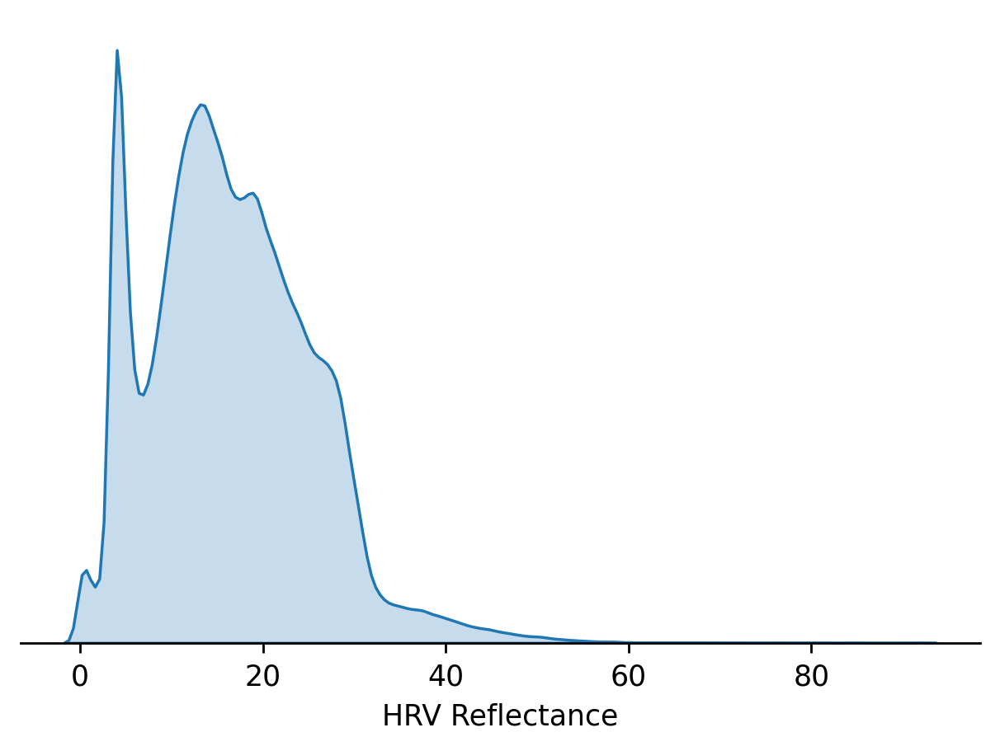

In [12]:
HRV_sample = np.random.choice(HRV_masked.flatten(), 1_000_000)

# Plotting
fig, ax = plt.subplots(dpi=250)

sns.kdeplot(HRV_sample, ax=ax, fill=True)

ax.set_yticks([])
ax.set_ylabel('')
ax.set_xlabel('HRV Reflectance')
hlp.hide_spines(ax, positions=['top', 'left', 'right'])

<br>

### Evaluating Reprojection to Tranverse Mercator

Before we can resample we need to define the area we're resampling to, we'll write a constructor to help us do this

In [13]:
def construct_area_def(scene, area_id, description, 
                       proj_id, projection,
                       west, south, east, north,
                       meters_per_pixel=None):
    
    if meters_per_pixel is not None:
        width = int((east - west) / meters_per_pixel)
        height = int((north - south) / meters_per_pixel)
    else:
        width = scene[list(scene.keys())[0]['name']].x.values.shape[0]
        height = scene[list(scene.keys())[0]['name']].y.values.shape[0]
        
    area_extent = (west, south, east, north)

    area_def = AreaDefinition(area_id, description, 
                              proj_id, projection,
                              width, height, area_extent)
    
    return area_def

meters_per_pixel = None#1000 # if None then will use same number of x and y points
west, south, east, north = (-3090000, 1690000, 4390000, 9014000)

area_id = 'UTM-32N'
description = 'WGS 84 / UTM zone 32N' # need to change
proj_id = 'UTM-32N'

projection = {
    'ellps': 'WGS84',
    'proj': 'tmerc',  # Transverse Mercator
    'units': 'm'  # meters
}

tm_area_def = construct_area_def(scene, area_id, description,
                                 proj_id, projection,
                                 west, south, east, north,
                                 meters_per_pixel)

tm_area_def.to_cartopy_crs()

C:\Users\Ayrto\anaconda3\envs\sat_image_processing\lib\site-packages\pyproj\crs\crs.py:543: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj_string = self.to_proj4()


_PROJ4Projection(+ellps=WGS84 +k=1.0 +lat_0=0.0 +lon_0=0.0 +no_defs=True +proj=tmerc +type=crs +units=m +x_0=0.0 +y_0=0.0 +no_defs)

<br>

We can now carry out the resampling using the `pyresample` library

In [14]:
%%time

resampled_scene = scene.resample(tm_area_def, resampler='nearest')

C:\Users\Ayrto\anaconda3\envs\sat_image_processing\lib\site-packages\pyresample\spherical.py:123: RuntimeWarning: invalid value encountered in true_divide
  self.cart /= np.sqrt(np.einsum('...i, ...i', self.cart, self.cart))
C:\Users\Ayrto\anaconda3\envs\sat_image_processing\lib\site-packages\pyresample\spherical.py:178: RuntimeWarning: invalid value encountered in double_scalars
  return (val + mod) % (2 * mod) - mod
C:\Users\Ayrto\anaconda3\envs\sat_image_processing\lib\site-packages\pyproj\crs\crs.py:543: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj_string = self.to_proj4()


Wall time: 5.43 s


<br>

We'll quickly check that the reprojection looks ok

<ipython-input-15-ec0e500c536a>:2: UserWarning: The default value for the *approx* keyword argument to TransverseMercator will change from True to False after 0.18.
  ax = plt.axes(projection=ccrs.TransverseMercator())
C:\Users\Ayrto\anaconda3\envs\sat_image_processing\lib\site-packages\dask\core.py:121: RuntimeWarning: invalid value encountered in cos
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Ayrto\anaconda3\envs\sat_image_processing\lib\site-packages\dask\core.py:121: RuntimeWarning: invalid value encountered in sin
  return func(*(_execute_task(a, cache) for a in args))


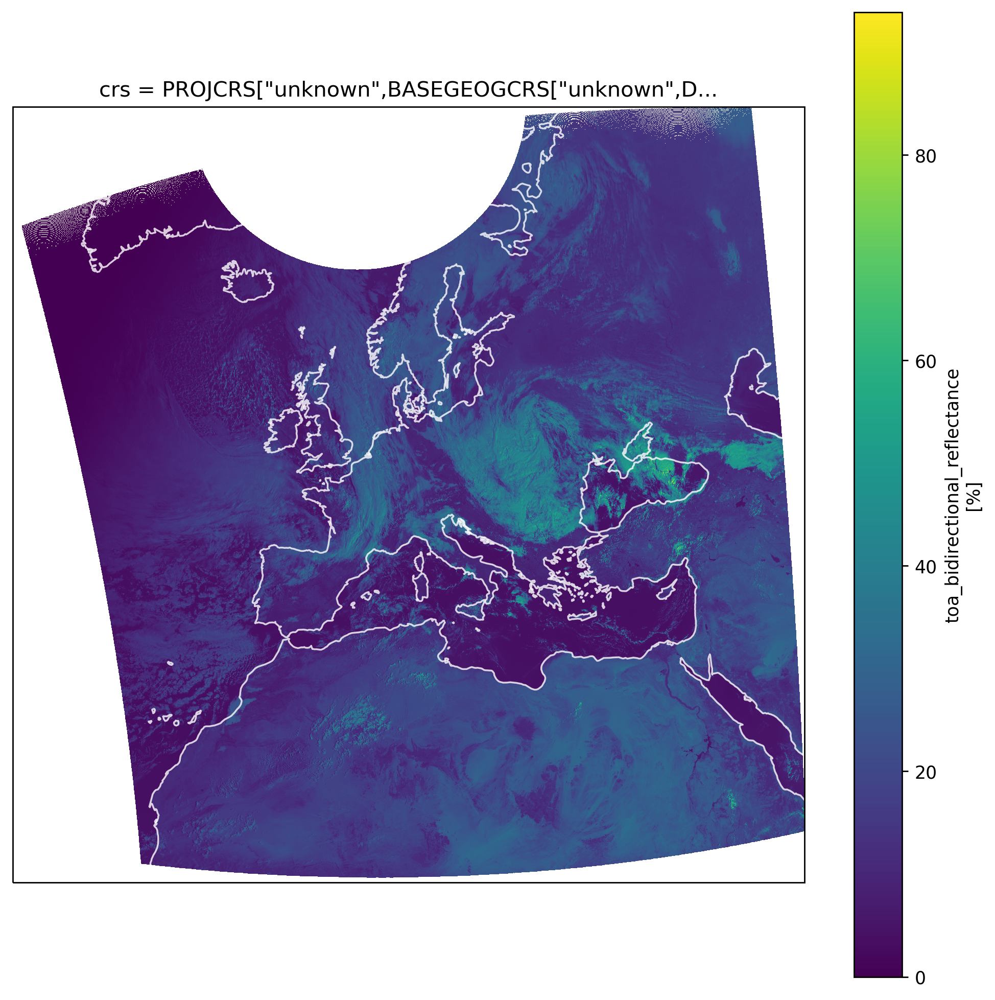

In [15]:
fig = plt.figure(dpi=250, figsize=(10, 10))
ax = plt.axes(projection=ccrs.TransverseMercator())

resampled_scene['HRV'].plot.imshow(ax=ax)

ax.coastlines(resolution='50m', alpha=0.8, color='white')

<br>

We want to gain a deeper understanding of the reprojection that's being carried out, to do this we'll manually reproject a sample of the original gridded coordinates

In [16]:
%%time

orig_x_values = scene['HRV'].x.values[::25]
orig_y_values = scene['HRV'].y.values[::25]

XX, YY = np.meshgrid(orig_x_values, orig_y_values)

df_proj_points = (gpd
                    .GeoSeries([
                        Point(x, y) 
                        for x, y 
                        in np.stack([XX.flatten(), YY.flatten()], axis=1)
                    ])
                    .set_crs(crs=scene['HRV'].area.crs_wkt)
                    .to_crs(crs=resampled_scene['HRV'].area.crs_wkt)
                    .apply(lambda point: pd.Series(list(point.coords)[0]))
                    .rename(columns={0: 'x_reproj', 1: 'y_reproj'})
                    .replace(np.inf, np.nan)
                    .pipe(lambda df: df.assign(x_orig=XX.flatten()))
                    .pipe(lambda df: df.assign(y_orig=YY.flatten()))
                   )

df_proj_points.head()

Wall time: 15.8 s


,x_reproj,y_reproj,x_orig,y_orig
0,4.409989e+06,1.821217e+06,2.877387e+06,1.395187e+06
1,4.372373e+06,1.813734e+06,2.852383e+06,1.395187e+06
2,4.335029e+06,1.806382e+06,2.827380e+06,1.395187e+06
3,4.297952e+06,1.799160e+06,2.802376e+06,1.395187e+06
4,4.261135e+06,1.792064e+06,2.777373e+06,1.395187e+06


<br>

We can then visualise the reprojection of the original grid against the regridded reprojection

<timed exec>:2: UserWarning: The default value for the *approx* keyword argument to TransverseMercator will change from True to False after 0.18.
C:\Users\Ayrto\anaconda3\envs\sat_image_processing\lib\site-packages\dask\core.py:121: RuntimeWarning: invalid value encountered in sin
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Ayrto\anaconda3\envs\sat_image_processing\lib\site-packages\dask\core.py:121: RuntimeWarning: invalid value encountered in cos
  return func(*(_execute_task(a, cache) for a in args))


Wall time: 28.8 s


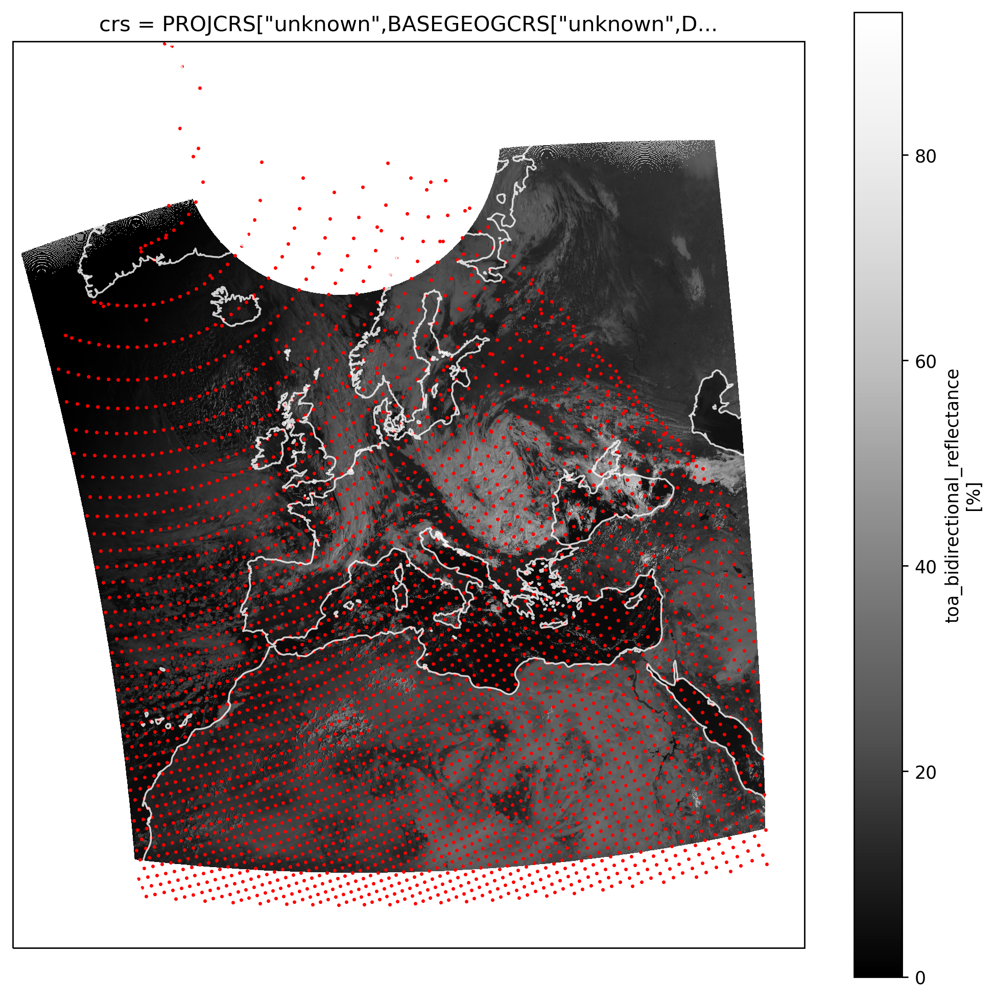

In [17]:
%%time

fig = plt.figure(dpi=250, figsize=(10, 10))
ax = plt.axes(projection=ccrs.TransverseMercator())

resampled_scene['HRV'].plot.imshow(ax=ax, cmap='Greys_r')

ax.coastlines(resolution='50m', alpha=0.8, color='white')
ax.scatter(df_proj_points['x_reproj'][::10], df_proj_points['y_reproj'][::10], s=1, color='red')

<br>

This is useful for quick visual inspection, for example we can see that the y axis gets stretched further the nearer to the pole. However, we want to get a better understanding of how the local cell resolution is changing for any given point, we'll begin by looking at this change for Greenwich.

In [18]:
def lon_lat_to_new_crs(lon, lat, crs):
    x, y = list(gpd
                .GeoSeries([Point(lon, lat)])
                .set_crs(4326)
                .to_crs(crs)
                .iloc[0]
                .coords
               )[0]
    
    return x, y

def calc_res_change(src_x, src_y, src_da, dst_da, src_dx=10, src_dy=10):
    src_crs = src_da.area.crs_wkt
    dst_crs = dst_da.area.crs_wkt
    
    src_x_width = np.abs(np.diff(src_da.x.values)[0])
    src_y_width = np.abs(np.diff(src_da.y.values)[0])
    dst_x_width = np.abs(np.diff(dst_da.x.values)[0])
    dst_y_width = np.abs(np.diff(dst_da.y.values)[0])
    
    s_points = (gpd
                .GeoSeries([
                    Point(src_x, src_y),
                    Point(src_x+src_dx, src_y),
                    Point(src_x, src_y+src_dy)
                ])
                .set_crs(src_crs)
                .to_crs(dst_crs)
               )
    
    dst_dx = s_points.iloc[0].distance(s_points.iloc[1])
    dst_dy = s_points.iloc[0].distance(s_points.iloc[2])
    
    x_ratio_change = (dst_dx/dst_x_width) / (src_dx/src_x_width)
    y_ratio_change = (dst_dy/dst_y_width) / (src_dy/src_y_width)
    
    return x_ratio_change, y_ratio_change

lon = 0
lat = 51.4934

src_x, src_y = lon_lat_to_new_crs(lon, lat, scene['HRV'].area.crs_wkt)

x_ratio_change, y_ratio_change = calc_res_change(src_x, src_y, 
                                                 scene['HRV'], 
                                                 resampled_scene['HRV'])

x_ratio_change, y_ratio_change

(0.8152971532590056, 1.2059906586298228)

<br>

We'll double check this by calculating it through a different method, in this case by locating the nearest cell for each scene and comparing their sizes in a common coordinate system

In [19]:
def get_da_nearest_cell_width_height(da, x, y, units_crs):
    nearest_loc = da.sel(x=x, y=y, method='nearest')

    nearest_x = nearest_loc.x.values
    nearest_y = nearest_loc.y.values

    next_nearest_x = da.x.values[list(da.x.values).index(nearest_x)+1]
    next_nearest_y = da.y.values[list(da.y.values).index(nearest_y)+1]
    
    s_points = (gpd
                .GeoSeries([
                    Point(nearest_x, nearest_y),
                    Point(next_nearest_x, nearest_y),
                    Point(nearest_x, next_nearest_y)
                ])
                .set_crs(da.area.crs_wkt)
                .to_crs(units_crs)
               )
    
    x_width = s_points.iloc[0].distance(s_points.iloc[1])
    y_height = s_points.iloc[0].distance(s_points.iloc[2])
    
    return x_width, y_height

src_x, src_y = lon_lat_to_new_crs(lon, lat, scene['HRV'].area.crs_wkt)
dst_x, dst_y = lon_lat_to_new_crs(lon, lat, resampled_scene['HRV'].area.crs_wkt)

src_x_width, src_y_height = get_da_nearest_cell_width_height(scene['HRV'], src_x, src_y, 27700)
dst_x_width, dst_y_height = get_da_nearest_cell_width_height(resampled_scene['HRV'], dst_x, dst_y, 27700)

print(f'The width has changed from {round(src_x_width/1000, 2)} km to {round(dst_x_width/1000, 2)} km')
print(f'The height has changed from {round(src_y_height/1000, 2)} km to {round(dst_y_height/1000, 2)} km')

The width has changed from 1.09 km to 1.34 km
The height has changed from 2.12 km to 1.75 km


<br>

This can easily be converted into a x and y pixel size ratio change which almost exactly matches our previous calculation. The first calculation is more accurate as the dx and dy can approach 0 and get closer to the true ratio change, however the `get_da_nearest_cell_width_height` function is still useful as it allows us to determine the cell width and height in more interpretable units

In [20]:
x_ratio_change, y_ratio_change = src_x_width/dst_x_width, src_y_height/dst_y_height

x_ratio_change, y_ratio_change

(0.8153064277077405, 1.20650418476304)

<br>

Iceland is stretched further still

In [21]:
def print_pixel_change(lon, lat, da_src, da_dst):
    src_x, src_y = lon_lat_to_new_crs(lon, lat, da_src.area.crs_wkt)
    dst_x, dst_y = lon_lat_to_new_crs(lon, lat, da_dst.area.crs_wkt)

    src_x_width, src_y_height = get_da_nearest_cell_width_height(da_src, src_x, src_y, 27700)
    dst_x_width, dst_y_height = get_da_nearest_cell_width_height(da_dst, dst_x, dst_y, 27700)

    print(f'The width has changed from {round(src_x_width/1000, 2)} km to {round(dst_x_width/1000, 2)} km')
    print(f'The height has changed from {round(src_y_height/1000, 2)} km to {round(dst_y_height/1000, 2)} km')
    
    return

lon = -18.779208
lat = 64.887370

print_pixel_change(lon, lat, scene['HRV'], resampled_scene['HRV'])

The width has changed from 1.52 km to 1.34 km
The height has changed from 4.75 km to 1.75 km


<br>

And contrasts with Marrakesh which is stretched less than Greenwich in the y axis

In [22]:
lon = -8.005657
lat = 31.636355

print_pixel_change(lon, lat, scene['HRV'], resampled_scene['HRV'])

The width has changed from 1.11 km to 1.34 km
The height has changed from 1.33 km to 1.75 km


<br>

We can check what the cell height and width are at the center of the image, they should both be close to 1km according to the SEVIRI documentation

> <b>LineDirGridStep</b> gives the grid step size in km SSP in the line direction. Default value is 3km for VIS and IR, and 1km for HRV. The on-ground grid step size of 3 km at the SSP represents an instrument scan step of 251.53 microrad divided by 3. - <a href="http://www.eumetsat.int/website/wcm/idc/idcplg?IdcService=GET_FILE&dDocName=PDF_TEN_05105_MSG_IMG_DATA&RevisionSelectionMethod=LatestReleased&Rendition=Web">EUMETSAT</a>

In [23]:
round_m_to_km = lambda m: round(m/1000, 2)

UTM_35N_epsg = 32632 # should be relatively accurate and is in meters

src_x = np.median(scene['HRV'].x.values)
src_y = np.median(scene['HRV'].y.values)

src_x_width, src_y_height = get_da_nearest_cell_width_height(scene['HRV'], src_x, src_y, UTM_35N_epsg)

round_m_to_km(src_x_width), round_m_to_km(src_y_height)

(1.03, 1.36)

<br>

### Comparing Reprojection Libraries

In the last section we used `pyresample` to carry out the data reprojection, here we'll explore `pyinterp`

https://pangeo-pyinterp.readthedocs.io/en/latest/examples.html



In [68]:
def extract_formatted_scene(scene, variable='HRV', 
                            x_coords_name='longitude', 
                            y_coords_name='latitude', 
                            x_units='degrees_east', 
                            y_units='degrees_north'):
    da = (scene
          [variable]
          .copy()
          .rename({
              'x': x_coords_name, 
              'y': y_coords_name
          })
         )
    
    da[x_coords_name].attrs['units'] = x_units
    da[y_coords_name].attrs['units'] = y_units
    
    return da

da = extract_formatted_scene(scene)
da_resampled = extract_formatted_scene(resampled_scene, 
                                       x_coords_name='x', y_coords_name='y', 
                                       x_units='metre', y_units='metre')

da_resampled

<xarray.DataArray 'my_index-8c012da72cc920a724b44c334cdebc71' (y: 4176, x: 5568)>
dask.array<my_index, shape=(4176, 5568), dtype=float32, chunksize=(4096, 4096), chunktype=numpy.ndarray>
Coordinates:
    crs      object PROJCRS["unknown",BASEGEOGCRS["unknown",DATUM["Unknown ba...
  * y        (y) float64 9.013e+06 9.011e+06 9.01e+06 ... 1.693e+06 1.691e+06
  * x        (x) float64 -3.089e+06 -3.088e+06 ... 4.388e+06 4.389e+06
Attributes:
    orbital_parameters:                     {'projection_longitude': 9.5, 'pr...
    sun_earth_distance_correction_applied:  True
    sun_earth_distance_correction_factor:   1.001276457947253
    units:                                  %
    wavelength:                             0.7 µm (0.5-0.9 µm)
    standard_name:                          toa_bidirectional_reflectance
    platform_name:                          Meteosat-10
    sensor:                                 seviri
    start_time:                             2020-10-01 08:20:09.248659
    end_time:                               2020-10-01 08:25:10.256259
    area:                                   Area ID: UTM-32N\nDescription: WG...
    name:                                   HRV
    resolution:                             1000.134348869
    calibration:                            reflectance
    modifiers:                              ()
    _satpy_id:                              DataID(name='HRV', wavelength=Wav...
    ancillary_variables:                    []

In [70]:
df_proj_points.head()

,x_reproj,y_reproj,x_orig,y_orig
0,4.409989e+06,1.821217e+06,2.877387e+06,1.395187e+06
1,4.372373e+06,1.813734e+06,2.852383e+06,1.395187e+06
2,4.335029e+06,1.806382e+06,2.827380e+06,1.395187e+06
3,4.297952e+06,1.799160e+06,2.802376e+06,1.395187e+06
4,4.261135e+06,1.792064e+06,2.777373e+06,1.395187e+06


In [79]:
df_proj_points.isnull().sum()

x_reproj    3702
y_reproj    3702
x_orig         0
y_orig         0
dtype: int64

In [80]:
geometry = gpd.points_from_xy(df_proj_points.dropna()['x_reproj'], df_proj_points.dropna()['y_reproj'])

gs_new_coords = gpd.GeoSeries(geometry, crs=UTM_35N_epsg).to_crs(4326)

gs_new_coords.head()

0    POINT (43.20954 13.72221)
1    POINT (42.91251 13.71146)
2    POINT (42.61680 13.70080)
3    POINT (42.32240 13.69022)
4    POINT (42.02929 13.67974)
dtype: geometry

<AxesSubplot:>

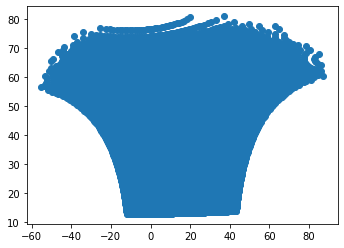

In [81]:
gs_new_coords.plot()

In [ ]:
def convert_points_crs(gs_points, old_crs, new_crs):

In [50]:
def reproj_with_manual_grid(da, old_x_coords, old_y_coords, 
                            new_x_coords, new_y_coords):
    
    x_axis = pyinterp.Axis(old_x_coords, is_circle=True)
    y_axis = pyinterp.Axis(old_y_coords)

    grid = pyinterp.Grid2D(x_axis, y_axis, da.data.T)
    mx, my = np.meshgrid(new_x_coords, new_y_coords, indexing='ij')

    mss = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)

    mss
    
# convert new x/y into lon/lat
    
reproj_with_manual_grid(da, da.longitude.values, da.latitude.values, new_x_coords, new_y_coords)

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

<br>

The issue with pyinterp is that interpolates to a rectangular based grid, which can have irregular or regular spacing

In [64]:
def reproj_with_xr_interpolator(da, new_x_coords, new_y_coords, 
                                x_coords_name='longitude', 
                                y_coords_name='latitude'):
    
    interpolator = pyinterp.backends.xarray.Grid2D(da, geodetic=True)
    xx, yy = np.meshgrid(new_x_coords, new_y_coords, indexing='ij')
    
    reprojected_data = (interpolator
                        .bivariate({
                            x_coords_name: xx.flatten(), 
                            y_coords_name: yy.flatten()
                        })
                        .reshape(xx.shape)
                       )
    
    return reprojected_data

reprojected_data = reproj_with_xr_interpolator(da, )

reprojected_data

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

C:\Users\Ayrto\anaconda3\envs\sat_image_processing\lib\site-packages\dask\core.py:121: RuntimeWarning: invalid value encountered in cos
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Ayrto\anaconda3\envs\sat_image_processing\lib\site-packages\dask\core.py:121: RuntimeWarning: invalid value encountered in sin
  return func(*(_execute_task(a, cache) for a in args))


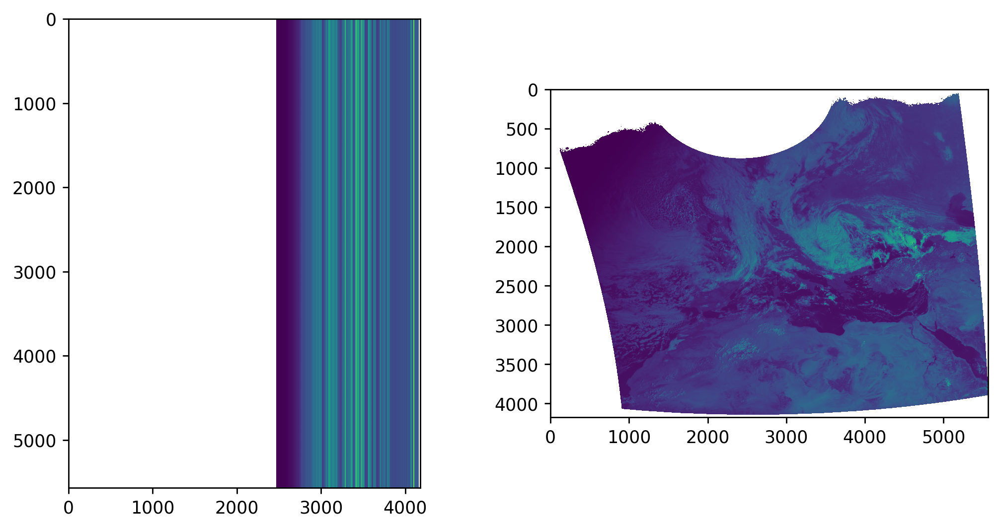

In [63]:
fig, axs = plt.subplots(dpi=250, figsize=(10, 5), ncols=2)

axs[0].imshow(reprojected_data)
axs[1].imshow(da_resampled.data)

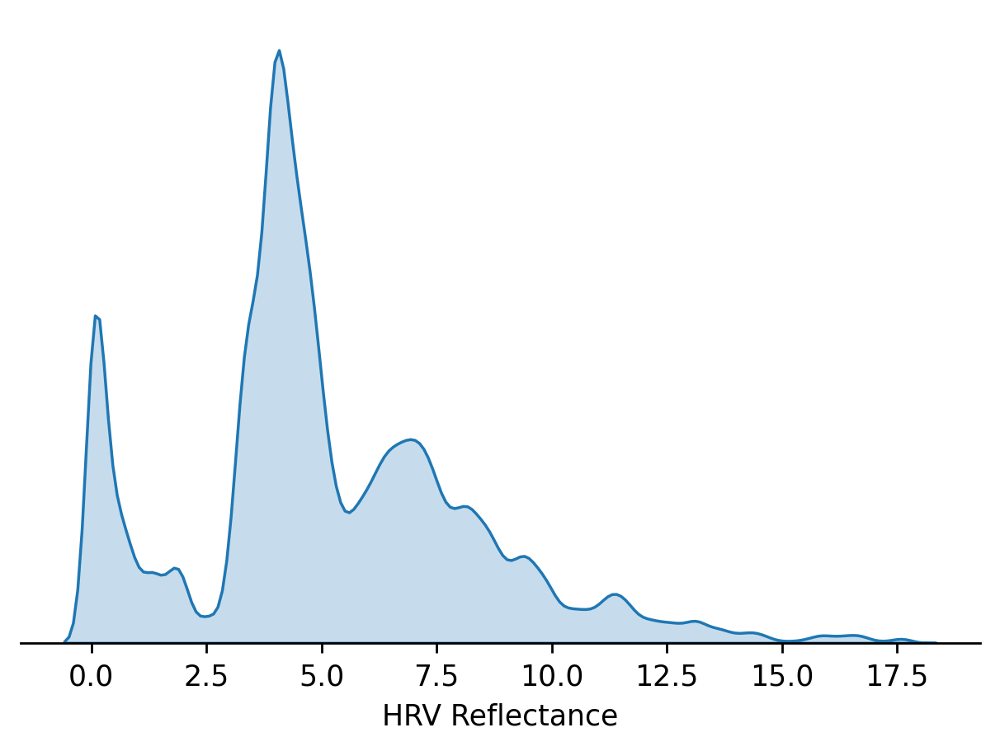

In [52]:
HRV_sample = np.random.choice(mss[~np.isnan(mss)].flatten(), 1_000_000)

# Plotting
fig, ax = plt.subplots(dpi=250)

sns.kdeplot(HRV_sample, ax=ax, fill=True)

ax.set_yticks([])
ax.set_ylabel('')
ax.set_xlabel('HRV Reflectance')
hlp.hide_spines(ax, positions=['top', 'left', 'right'])